In [96]:
#Project details: FIFA - MoneyBall

In [1]:
    # The Challenge-PREDICT THE MARKET VALUE OF A PLAYER
# Perform an end-to-end analysis putting into practice what I have learned so far.
#I will apply statistical or machine learning techniques and present the results to the class.

In [2]:
# Libraries

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import pickle as pkl

import warnings
warnings.filterwarnings('ignore')

In [4]:
#To be able to see all the columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [5]:
# Dataset:
# In this project I use the provided fifa21_male2.csv dataset.

In [6]:
data = pd.read_csv('./fifa21_male2.csv', low_memory=False)

In [7]:
#1. Taking the first look on the data.

In [8]:
data.head(5)

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,Club Logo,Flag Photo,POT,Team & Contract,Height,Weight,foot,Growth,Joined,Loan Date End,Value,Wage,Release Clause,Contract,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,https://cdn.sofifa.com/teams/55/light_60.png,https://cdn.sofifa.com/flags/it.png,69,Udinese 2008 ~ 2016,"6'0""",181lbs,Left,0,"Jul 1, 2008",NaN,€625K,€7K,€0,2008 ~ 2016,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High,2 ★,71,59,70,71,68,69,4,65+0,65+0,65+0,68+0,67+0,67+0,67+0,68+0,68+0,68+0,68+0,69+0,69+0,69+0,69+0,69+0,71+-2,70+-1,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,https://cdn.sofifa.com/teams/2013/light_60.png,https://cdn.sofifa.com/flags/es.png,71,KAS Eupen 2014 ~ 2019,"5'10""",143lbs,Right,0,"Jul 19, 2014",NaN,€600K,€7K,€1.1M,2014 ~ 2019,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium,1 ★,53,69,73,69,58,63,4,67+1,67+1,67+1,67+0,68+0,68+0,68+0,67+0,70+1,70+1,70+1,68+1,70+1,70+1,70+1,68+1,62+1,66+1,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,https://cdn.sofifa.com/teams/1800/light_60.png,https://cdn.sofifa.com/flags/gb-eng.png,71,Coventry City 2016 ~ 2020,"5'9""",161lbs,Right,0,"Jan 7, 2016",NaN,€1.1M,€15K,€0,2016 ~ 2020,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low,2 ★,45,68,76,77,36,52,11,64+0,64+0,64+0,70+0,69+0,69+0,69+0,70+0,71+0,71+0,71+0,68+0,66+0,66+0,66+0,68+0,52+0,54+0,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,https://cdn.sofifa.com/teams/106/light_60.png,https://cdn.sofifa.com/flags/tt.png,82,Sunderland 2009,"5'11""",165lbs,Right,14,NaN,NaN,€0,€0,€0,2009,264,54,70,60,80,NaN,255,68,NaN,46,64,77,176,59,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN,1 ★,61,66,66,69,47,60,3,67+0,67+0,67+0,66+0,67+0,67+0,67+0,66+0,70+0,70+0,70+0,66+0,68+0,68+0,68+0,66+0,56+0,65+0,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,https://cdn.sofifa.com/teams/101146/light_60.png,https://cdn.sofifa.com/flags/es.png,81,Vissel Kobe 2018 ~ 2021,"5'7""",150lbs,Right,0,"Jul 16, 2018",NaN,€5.5M,€12K,€7.2M,2018 ~ 2021,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium,4 ★,58,70,85,85,63,59,149,72+3,72+3,72+3,79+0,79+0,79+0,79+0,79+0,82+-1,82+-1,82+-1,79+2,81+0,81+0,81+0,79+2,70+3,73+3,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


In [9]:
data = data.drop_duplicates()

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17125 entries, 0 to 17124
Columns: 107 entries, ID to Gender
dtypes: float64(10), int64(45), object(52)
memory usage: 14.1+ MB


In [11]:
data.describe()

,ID,Age,OVA,BOV,POT,Growth,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,PAC,SHO,PAS,DRI,DEF,PHY
count,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17067.000000,17125.000000,17067.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17118.000000,17118.000000,17067.000000,17125.000000,16702.000000,17125.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000
mean,219388.716204,25.272934,66.965022,67.900204,72.489810,5.524788,258.537752,51.621314,47.956672,53.598832,60.507620,45.005742,266.607591,57.846423,49.574676,44.387270,54.324321,60.642803,322.693664,65.445898,65.443036,64.602273,62.924847,64.715591,302.414774,59.711416,65.170212,63.309606,65.308555,49.135708,261.922803,56.997839,47.085582,52.372766,55.443605,50.251445,59.940965,141.469898,47.246949,48.279358,46.099725,77.609693,15.600467,15.484672,15.472058,15.514277,15.738628,1631.256175,361.372146,68.091620,54.967299,58.926540,64.209869,50.266102,64.910715
std,37499.197507,4.942665,6.864329,6.637538,5.769949,5.787539,72.255687,17.875715,19.391547,16.947164,13.960635,17.729483,76.809344,18.047250,18.188344,17.504128,14.856911,15.873647,54.933593,14.657889,14.437377,14.372443,9.037279,14.031563,49.380576,13.417931,11.918063,15.313272,12.627212,19.044862,62.913935,17.021619,20.846705,19.094432,13.730080,15.696363,11.751111,61.595180,20.182548,21.483597,21.185154,81.136603,16.828637,16.143679,15.997328,16.406064,17.130908,260.357024,40.252290,11.147116,13.877605,10.186728,9.832734,16.853801,9.660260
min,2.000000,16.000000,38.000000,42.000000,47.000000,-1.000000,33.000000,6.000000,3.000000,5.000000,7.000000,4.000000,43.000000,5.000000,4.000000,5.000000,9.000000,5.000000,113.000000,12.000000,11.000000,14.000000,24.000000,17.000000,128.000000,12.000000,22.000000,11.000000,16.000000,4.000000,50.000000,9.000000,4.000000,2.000000,10.000000,7.000000,12.000000,17.000000,3.000000,5.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,731.000000,228.000000,25.000000,16.000000,25.000000,28.000000,12.000000,27.000000
25%,204082.000000,21.000000,62.000000,64.000000,69.000000,0.000000,232.000000,41.000000,33.000000,46.000000,56.000000,32.000000,232.000000,53.000000,37.000000,32.000000,45.000000,57.000000,294.000000,58.000000,59.000000,57.000000,57.000000,57.000000,272.000000,50.000000,58.000000,56.000000,58.000000,35.000000,235.000000,45.000000,26.000000,43.000000,47.000000,40.000000,53.000000,84.000000,29.000000,28.000000,25.000000,48.000000,8.000000,8.000000,8.000000,8.000000,8.000000,1492.000000,333.000000,62.000000,46.000000,52.000000,59.000000,35.000000,59.000000
50%,228961.000000,25.000000,67.000000,68.000000,72.000000,4.000000,271.000000,56.000000,52.000000,57.000000,63.000000,46.000000,279.000000,63.000000,51.000000,43.000000,57.000000,64.000000,331.000000,68.000000,68.000000,67.000000,63.000000,67.000000,308.000000,61.000000,66.000000,66.000000,67.000000,53.000000,269.000000,60.000000,53.000000,57.000000,57.000000,51.000000,61.000000,158.000000,52.000000,55.000000,52.000000,53.000000,11.000000,11.000000,11.000000,11.000000,11.000000,1659.000000,362.000000,69.000000,58.000000,60.000000,65.000000,53.000000,66

In [12]:
data.shape


(17125, 107)

In [13]:
# Check missing data
data.isnull().sum().sum()

17753

In [14]:
# 02-Cleaning/Wrangling/EDA
    # Change headers names.
    # Deal with NaN values.
    # Categorical Features.
    # Numerical Features.
    # Exploration.

In [15]:
# DATA CLEANING

In [16]:
# Standardize column names will be meaningfull strings, lower cased and with '_' instead of 'spaces'
data.columns = [column.lower().replace(' ', '_') for column in data.columns]
data.columns

Index(['id', 'name', 'age', 'ova', 'nationality', 'club', 'bov', 'bp',
       'position', 'player_photo',
       ...
       'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb', 'gk', 'gender'],
      dtype='object', length=107)

In [17]:
# Renaming columns
data = data.rename(columns={'unnamed:_0':'id'})

In [18]:
# Check  NaN values

In [19]:
data.isnull().values.any()

True

In [20]:
data.isna().sum()


id                      0
name                    0
age                     0
ova                     0
nationality             0
club                   23
bov                     0
bp                      0
position              413
player_photo            0
club_logo              23
flag_photo              0
pot                     0
team_&_contract         0
height                  0
weight                  0
foot                    0
growth                  0
joined                 58
loan_date_end       16215
value                   0
wage                    0
release_clause          0
contract                0
attacking               0
crossing                0
finishing               0
heading_accuracy        0
short_passing           0
volleys                58
skill                   0
dribbling               0
curve                  58
fk_accuracy             0
long_passing            0
ball_control            0
movement                0
acceleration            0
sprint_speed

In [21]:
#Check Categoricals.Numericals

In [22]:
cat = data.select_dtypes(include='object')
cat.columns

Index(['name', 'nationality', 'club', 'bp', 'position', 'player_photo',
       'club_logo', 'flag_photo', 'team_&_contract', 'height', 'weight',
       'foot', 'joined', 'loan_date_end', 'value', 'wage', 'release_clause',
       'contract', 'w/f', 'sm', 'a/w', 'd/w', 'ir', 'hits', 'ls', 'st', 'rs',
       'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm',
       'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb',
       'rcb', 'rb', 'gk', 'gender'],
      dtype='object')

In [23]:
num = data.select_dtypes(include=np.number)
num.columns

Index(['id', 'age', 'ova', 'bov', 'pot', 'growth', 'attacking', 'crossing',
       'finishing', 'heading_accuracy', 'short_passing', 'volleys', 'skill',
       'dribbling', 'curve', 'fk_accuracy', 'long_passing', 'ball_control',
       'movement', 'acceleration', 'sprint_speed', 'agility', 'reactions',
       'balance', 'power', 'shot_power', 'jumping', 'stamina', 'strength',
       'long_shots', 'mentality', 'aggression', 'interceptions', 'positioning',
       'vision', 'penalties', 'composure', 'defending', 'marking',
       'standing_tackle', 'sliding_tackle', 'goalkeeping', 'gk_diving',
       'gk_handling', 'gk_kicking', 'gk_positioning', 'gk_reflexes',
       'total_stats', 'base_stats', 'pac', 'sho', 'pas', 'dri', 'def', 'phy'],
      dtype='object')

In [24]:
# 03- Processing Data
    # Dealing with outliers.
    # Normalization.
    # Encoding Categorical Data.
    # Splitting into train set and test set.

In [25]:
#Check Categoricals
for column in  cat.columns:
    print(column, len(cat[column].unique()))

name 16176
nationality 167
club 918
bp 15
position 623
player_photo 17125
club_logo 919
flag_photo 167
team_&_contract 9822
height 21
weight 57
foot 2
joined 1954
loan_date_end 39
value 216
wage 142
release_clause 1200
contract 434
w/f 5
sm 5
a/w 4
d/w 4
ir 5
hits 529
ls 278
st 278
rs 278
lw 178
lf 167
cf 167
rf 167
rw 178
lam 321
cam 321
ram 321
lm 309
lcm 269
cm 269
rcm 269
rm 309
lwb 279
ldm 312
cdm 312
rdm 312
rwb 279
lb 275
lcb 328
cb 328
rcb 328
rb 275
gk 169
gender 1


In [26]:
# Modifying the Data Type

In [27]:
df = data.copy()

In [28]:
#Convert Height(inch,feet-cm)
def convert_height(x):
        feet = int(x.split("\'")[0])
        inch = int(x.split("\'")[1].split('"')[0])
        inch += feet * 12
        cm = round(inch*2.54,0)
        return cm

df['height'] = df['height'].apply(convert_height)
df['height']

0        183.0
1        178.0
2        175.0
3        180.0
4        170.0
5        173.0
6        170.0
7        178.0
8        178.0
9        170.0
10       180.0
11       183.0
12       175.0
13       188.0
14       188.0
15       188.0
16       173.0
17       193.0
18       193.0
19       190.0
20       193.0
21       168.0
22       178.0
23       175.0
24       188.0
25       185.0
26       193.0
27       175.0
28       183.0
29       180.0
30       190.0
31       180.0
32       180.0
33       178.0
34       193.0
35       185.0
36       188.0
37       175.0
38       180.0
39       175.0
40       175.0
41       198.0
42       180.0
43       190.0
44       185.0
45       175.0
46       185.0
47       180.0
48       183.0
49       180.0
50       188.0
51       165.0
52       185.0
53       190.0
54       183.0
55       188.0
56       196.0
57       178.0
58       170.0
59       178.0
60       178.0
61       178.0
62       175.0
63       183.0
64       180.0
65       173.0
66       1

In [29]:
# Convert lbs in kg
df['weight'] = df['weight'].apply(lambda x: round(float(str(x).replace('lbs',''))/2.2046226218,0))
df['weight']

0         82.0
1         65.0
2         73.0
3         75.0
4         68.0
5         74.0
6         72.0
7         71.0
8         79.0
9         71.0
10        76.0
11        75.0
12        73.0
13        86.0
14        90.0
15        76.0
16        70.0
17        90.0
18        95.0
19        87.0
20        91.0
21        70.0
22        75.0
23        74.0
24        79.0
25        85.0
26        92.0
27        75.0
28        84.0
29        74.0
30        92.0
31        76.0
32        82.0
33        80.0
34        82.0
35        79.0
36        83.0
37        70.0
38        80.0
39        74.0
40        69.0
41        92.0
42        74.0
43        90.0
44        93.0
45        82.0
46        84.0
47        76.0
48        75.0
49        77.0
50        78.0
51        64.0
52        78.0
53        84.0
54        79.0
55        88.0
56        85.0
57        81.0
58        64.0
59        77.0
60        77.0
61        71.0
62        75.0
63        76.0
64        77.0
65        70.0
66        

In [30]:
# Convert the symbols

In [31]:
df[['value', 'wage', 'release_clause']]

,value,wage,release_clause
0,€625K,€7K,€0
1,€600K,€7K,€1.1M
2,€1.1M,€15K,€0
3,€0,€0,€0
4,€5.5M,€12K,€7.2M
5,€725K,€5K,€0
6,€2.8M,€44K,€5.3M
7,€1K,€60K,€0
8,€0,€0,€0
9,€400K,€40K,€0


In [32]:
def convert_amount(x):
        if list(x)[-1] == 'K':
            return float(x.replace('€','').replace('K','').replace('M',''))*1000
        elif list(x)[-1] == 'M':
            return float(x.replace('€','').replace('K','').replace('M',''))*1000000
        else: 
            return float(x.replace('€','').replace('K','').replace('M',''))
        
df['value'] = df['value'].apply(convert_amount)
df['wage'] = df['wage'].apply(convert_amount)
df['release_clause'] = df['release_clause'].apply(convert_amount)

df[['value', 'wage', 'release_clause']]

,value,wage,release_clause
0,625000.0,7000.0,0.0
1,600000.0,7000.0,1100000.0
2,1100000.0,15000.0,0.0
3,0.0,0.0,0.0
4,5500000.0,12000.0,7200000.0
5,725000.0,5000.0,0.0
6,2800000.0,44000.0,5300000.0
7,1000.0,60000.0,0.0
8,0.0,0.0,0.0
9,400000.0,40000.0,0.0


In [33]:
df[['w/f', 'sm', 'ir']]

,w/f,sm,ir
0,3 ★,2★,2 ★
1,4 ★,3★,1 ★
2,4 ★,4★,2 ★
3,3 ★,1★,1 ★
4,4 ★,4★,4 ★
5,2 ★,3★,2 ★
6,4 ★,4★,2 ★
7,2 ★,3★,3 ★
8,3 ★,2★,3 ★
9,3 ★,3★,2 ★


In [34]:
#Convert to numericals
df['sm'] = df['w/f'].apply(lambda x: float(str(x).replace('★', '')))
df['w/f'] = df['sm'].apply(lambda x: float(str(x).replace('★', '')))
df['ir'] = df['ir'].apply(lambda x: float(str(x).replace('★', '')))

df[['w/f', 'sm', 'ir']]

,w/f,sm,ir
0,3.0,3.0,2.0
1,4.0,4.0,1.0
2,4.0,4.0,2.0
3,3.0,3.0,1.0
4,4.0,4.0,4.0
5,2.0,2.0,2.0
6,4.0,4.0,2.0
7,2.0,2.0,3.0
8,3.0,3.0,3.0
9,3.0,3.0,2.0


In [35]:
num = df.select_dtypes(include=np.number)
cat = df.select_dtypes(include='object')

In [36]:
numerical.apply(lambda x: round(x,2))

NameError: name 'numerical' is not defined

In [37]:
#checking NaN values
df.isnull().sum().sum()

17753

In [38]:
pd.set_option('display.max_rows',None)
count = df.isna().sum()
count

id                      0
name                    0
age                     0
ova                     0
nationality             0
club                   23
bov                     0
bp                      0
position              413
player_photo            0
club_logo              23
flag_photo              0
pot                     0
team_&_contract         0
height                  0
weight                  0
foot                    0
growth                  0
joined                 58
loan_date_end       16215
value                   0
wage                    0
release_clause          0
contract                0
attacking               0
crossing                0
finishing               0
heading_accuracy        0
short_passing           0
volleys                58
skill                   0
dribbling               0
curve                  58
fk_accuracy             0
long_passing            0
ball_control            0
movement                0
acceleration            0
sprint_speed

In [39]:
# Check the columns with null
null = count.index[count != 0].tolist()
null

['club',
 'position',
 'club_logo',
 'joined',
 'loan_date_end',
 'volleys',
 'curve',
 'agility',
 'balance',
 'jumping',
 'interceptions',
 'positioning',
 'vision',
 'composure',
 'sliding_tackle',
 'a/w',
 'd/w']

In [40]:
# Drop the insignificant nulls
df = df.dropna(subset=['club', 'club_logo', 'joined', 'volleys', 'curve', 'agility', 'balance', 'interceptions', 'positioning', 'vision', 'sliding_tackle','a/w',
 'd/w'])

In [41]:
pd.options.display.max_rows = 15

In [42]:
df = df.drop(columns=['composure', 'loan_date_end'])


In [43]:
#Remove unnecessary columns

In [44]:
df1 = df.drop(columns=['id', 'release_clause', 'w/f', 'sm', 'position', 'ir', 'pac', 'sho','pas', 'dri','def','phy',
                       'player_photo', 'club_logo', 'flag_photo', 'team_&_contract', 'foot',
                       'joined', 'contract', 'a/w', 'd/w', 'hits', 'ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw','lam', 
                       'cam','ram', 'lcm', 'cm', 'rcm','rm', 'lwb', 'ldm', 'cdm','rdm','rwb','lb', 'lcb', 'cb', 'rcb', 'rb',
                       'gk', 'gender'])

df1


,name,age,ova,nationality,club,bov,bp,pot,height,weight,growth,value,wage,attacking,crossing,finishing,heading_accuracy,short_passing,volleys,skill,dribbling,curve,fk_accuracy,long_passing,ball_control,movement,acceleration,sprint_speed,agility,reactions,balance,power,shot_power,jumping,stamina,strength,long_shots,mentality,aggression,interceptions,positioning,vision,penalties,defending,marking,standing_tackle,sliding_tackle,goalkeeping,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,total_stats,base_stats,lm
0,G. Pasquale,33,69,Italy,Udinese,71,LWB,69,183.0,82.0,0,625000.0,7000.0,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,208,70,69,69.0,56,14,5,15,10,12,1929,408,69+0
1,Luis García,37,71,Spain,KAS Eupen,70,CM,71,178.0,65.0,0,600000.0,7000.0,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,153,70,43,40.0,56,9,12,13,11,11,1906,385,68+1
2,J. Cole,33,71,England,Coventry City,71,CAM,71,175.0,73.0,0,1100000.0,15000.0,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,99,35,34,30.0,51,9,6,13,16,7,1770,354,68+0
4,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,81,170.0,68.0,0,5500000.0,12000.0,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,181,68,57,56.0,45,6,13,6,13,7,2014,420,79+2
5,D. Odonkor,27,66,Germany,Alemannia Aachen,66,RW,70,173.0,74.0,4,725000.0,5000.0,271,61,53,42,58,57.0,276,67,61.0,42,44,62,406,90,91,75.0,65,85.0,315,71,70.0,64,61,49,256,63,26.0,63.0,58.0,46,79,22,26,31.0,46,8,13,7,9,9,1649,360,64+0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17120,A. Medioub,22,64,France,CD Tondela,66,CB,69,198.0,75.0,5,550000.0,2000.0,197,35,23,66,47,26.0,193,44,26.0,33,34,56,243,52,55,46.0,48,42.0,279,48,70.0,59,74,28,218,69,58.0,23.0,29.0,39,198,61,71,66.0,39,11,8,8,5,7,1367,302,43+2
17121,W. Rickard,18,56,Wales,Burnley,58,CAM,66,178.0,77.0,10,130000.0,3000.0,248,50,43,50,64,41.0,264,57,42.0,50,61,54,298,61,63,52.0,54,68.0,271,51,62.0,53,57,48,259,51,50.0,55.0,53.0,50,132,34,42,56.0,57,12,15,7,12,11,1529,319,56+2
17122,C. Barrett,18,56,England,Burnley,56,RB,67,175.0,70.0,11,130000.0,2000.0,218,55,34,53,42,34.0,212,52,43.0,34,36,47,308,66,61,54.0,59,68.0,233,28,61.0,53,54,37,256,58,55.0,49.0,45.0,49,163,55,54,54.0,40,8,7,5,12,8,1430,303,50+2
17123,J. Gazibegović,20,62,Bosnia Herzegovina,SK Sturm Graz,62,RB,73,175.0,67.0,11,475000.0,3000.0,223,62,26,52,60,23.0,258,55,43.0,46,57,57,349,72,70,74.0,56,77.0,261,51,72.0,57,48,33,257,61,58.0,46.0,56.0,36,180,57,62,61.0,51,15,13,8,6,9,1579,335,56+2


In [45]:
df1.corr()

,age,ova,bov,pot,height,weight,growth,value,wage,attacking,crossing,finishing,heading_accuracy,short_passing,volleys,skill,dribbling,curve,fk_accuracy,long_passing,ball_control,movement,acceleration,sprint_speed,agility,reactions,balance,power,shot_power,jumping,stamina,strength,long_shots,mentality,aggression,interceptions,positioning,vision,penalties,defending,marking,standing_tackle,sliding_tackle,goalkeeping,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,total_stats,base_stats
age,1.000000,0.515203,0.453997,-0.254364,0.090782,0.255278,-0.859314,0.099739,0.205647,0.186379,0.151389,0.106141,0.171656,0.176524,0.188295,0.171351,0.040462,0.181841,0.223965,0.222822,0.120069,-0.047884,-0.186560,-0.181522,-0.039877,0.502835,-0.086362,0.317080,0.307310,0.197672,0.070937,0.349849,0.191796,0.273655,0.275485,0.189864,0.119846,0.235114,0.194282,0.118772,0.157257,0.106799,0.087251,0.123917,0.119623,0.121642,0.120906,0.130631,0.118661,0.285426,0.412815
ova,0.515203,1.000000,0.985899,0.586998,0.024433,0.148646,-0.599804,0.637729,0.598736,0.432960,0.386667,0.305221,0.304318,0.493016,0.362915,0.443437,0.351225,0.399574,0.369465,0.483226,0.430810,0.309404,0.143779,0.153062,0.228198,0.871751,0.101145,0.550662,0.536766,0.260629,0.336132,0.335375,0.391706,0.495267,0.382774,0.302347,0.337813,0.507241,0.313494,0.250420,0.290862,0.237606,0.210090,0.037244,0.036995,0.036080,0.031905,0.042764,0.035831,0.611344,0.832008
bov,0.453997,0.985899,1.000000,0.623518,0.013479,0.129406,-0.547070,0.647058,0.598377,0.466284,0.400107,0.337824,0.334662,0.533794,0.388503,0.475791,0.389107,0.419693,0.387323,0.515876,0.471127,0.343375,0.179578,0.189308,0.257110,0.871912,0.128742,0.576975,0.552730,0.265102,0.369955,0.332507,0.420458,0.524014,0.400052,0.316968,0.366354,0.529677,0.336216,0.270206,0.310541,0.257705,0.228488,-0.009985,-0.009932,-0.010722,-0.014758,-0.003294,-0.010703,0.639182,0.829326
pot,-0.254364,0.586998,0.623518,1.000000,-0.025103,-0.045264,0.295707,0.571759,0.469333,0.234160,0.209308,0.173343,0.133611,0.316804,0.177163,0.265978,0.265050,0.221130,0.163229,0.281666,0.289798,0.268611,0.199651,0.198624,0.192285,0.469002,0.132737,0.223510,0.265499,0.076887,0.171072,0.023796,0.190195,0.240950,0.137420,0.137724,0.187537,0.304540,0.139167,0.140836,0.146784,0.138228,0.129478,-0.008985,-0.007092,-0.008451,-0.013953,-0.007267,-0.007831,0.331228,0.470429
height,0.090782,0.024433,0.013479,-0.025103,1.000000,0.765941,-0.053640,-0.000487,0.020865,-0.355836,-0.494529,-0.361384,0.059297,-0.354677,-0.334389,-0.456349,-0.486030,-0.440877,-0.401422,-0.316588,-0.413523,-0.638828,-0.551503,-0.455393,-0.639342,-0.001640,-0.782011,-0.133764,-0.169937,0.009106,-0.279202,0.555631,-0.376094,-0.306298,-0.021135,-0.035334,-0.428910,-0.371027,-0.311834,-0.051191,-0.047554,-0.047749,-0.055109,0.349203,0.344051,0.345658,0.341632,0.344477,0.346649,-0.370411,-0.123657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
gk_kicking,0.120906,0.031905,-0.014758,-0.013953,0.341632,0.319735,-0.051436,0.001680,-0.011794,-0.754588,-0.642798,-0.569182,-0.711582,-0.713159,-0.565062,-0.700712,-0.746511,-0.583485,-0.521288,-0.559093,-0.778306,-0.559126,-0.556703,-0.563777,-0.500783,-0.023779,-0.482842,-0.561739,-0.282883,-0.147039,-0.648100,-0.081959,-0.586867,-0.716543,-0.546227,-0.443505,-0.661207,-0.339123,-0.589514,-0.494311,-0.493697,-0.490757,-0.469218,0.983965,0.964016,0.963740,1.000000,0.963238,0.964382,-0.623832,0.093385
gk_positioning,0.130631,0.042764,-0.003294,-0.007267,0.344477,0.325642,-0.057641,0.003701,-0.009650,-0.756060,-0.644533,-0.571687,-0.710804,-0.713921,-0.566721,-0.703259,-0.748218,-0.586547,-0.525539,-0.560254,-0.779421,-0.559133,-0.559532,-0.564879,-0.502403,-0.014625,-0.483001,-0.561952,-0.289480,-0.142550,-0.649344,-0.075595,-0.588809,-0.716621,-0.543934,-0.440291,-0.663321,-0.340296,-0.592994,-0.491

In [46]:
#Multicollinearity
df1_corr = df1.corr().unstack()
highest_corr = df1_corr.sort_values(kind="quicksort")

print(highest_corr[-200:-51])

attacking        crossing           0.844168
                 curve              0.851563
curve            attacking          0.851563
total_stats      crossing           0.853836
crossing         total_stats        0.853836
                                      ...   
goalkeeping      gk_diving          0.987723
defending        standing_tackle    0.987796
standing_tackle  defending          0.987796
goalkeeping      gk_reflexes        0.987981
gk_reflexes      goalkeeping        0.987981
Length: 149, dtype: float64


In [47]:
print(highest_corr[0:10])

growth        age            -0.859314
age           growth         -0.859314
goalkeeping   ball_control   -0.792158
ball_control  goalkeeping    -0.792158
gk_reflexes   ball_control   -0.784342
ball_control  gk_reflexes    -0.784342
gk_diving     ball_control   -0.783196
ball_control  gk_diving      -0.783196
              gk_handling    -0.782220
gk_handling   ball_control   -0.782220
dtype: float64


In [48]:
df1.columns

Index(['name', 'age', 'ova', 'nationality', 'club', 'bov', 'bp', 'pot',
       'height', 'weight', 'growth', 'value', 'wage', 'attacking', 'crossing',
       'finishing', 'heading_accuracy', 'short_passing', 'volleys', 'skill',
       'dribbling', 'curve', 'fk_accuracy', 'long_passing', 'ball_control',
       'movement', 'acceleration', 'sprint_speed', 'agility', 'reactions',
       'balance', 'power', 'shot_power', 'jumping', 'stamina', 'strength',
       'long_shots', 'mentality', 'aggression', 'interceptions', 'positioning',
       'vision', 'penalties', 'defending', 'marking', 'standing_tackle',
       'sliding_tackle', 'goalkeeping', 'gk_diving', 'gk_handling',
       'gk_kicking', 'gk_positioning', 'gk_reflexes', 'total_stats',
       'base_stats', 'lm'],
      dtype='object')

In [49]:
#EDA

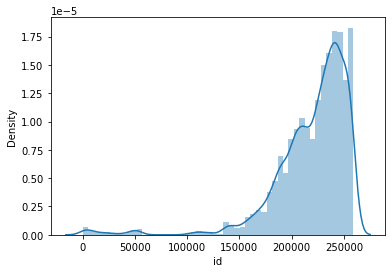

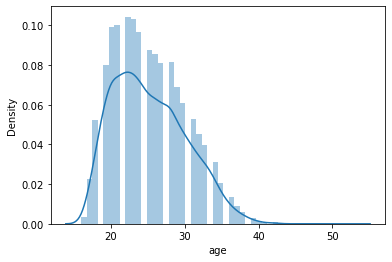

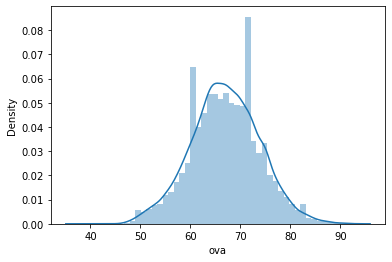

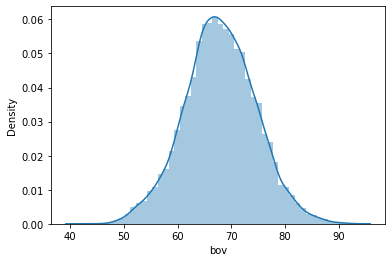

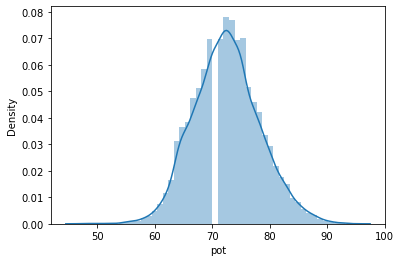

...

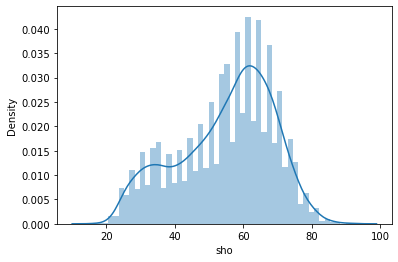

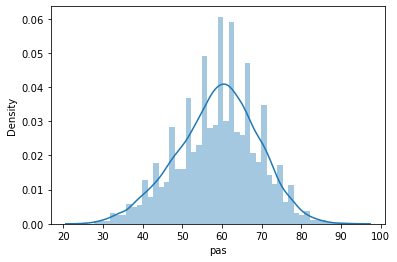

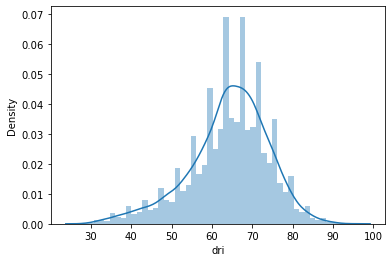

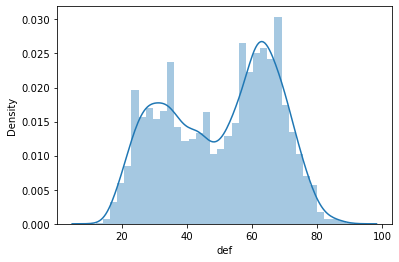

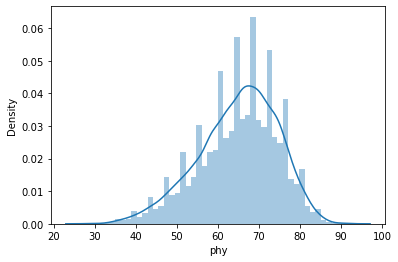

In [50]:
#Visualizing the data
for column in data.select_dtypes(np.number).columns:
    sns.distplot(data[column])
    plt.show()

In [51]:
#RANK THE PLAYER BY VALUE

In [52]:
#Reducing the dataframe to relevant columns for prediction

In [53]:
df2 = df[['name','age','ova', 'value','wage','position','club']]
df2.drop_duplicates()

df2


,name,age,ova,value,wage,position,club
0,G. Pasquale,33,69,625000.0,7000.0,LM,Udinese
1,Luis García,37,71,600000.0,7000.0,CM CAM CDM,KAS Eupen
2,J. Cole,33,71,1100000.0,15000.0,CAM RM RW LM,Coventry City
4,Iniesta,36,81,5500000.0,12000.0,CM CAM,Vissel Kobe
5,D. Odonkor,27,66,725000.0,5000.0,RW RM,Alemannia Aachen
...,...,...,...,...,...,...,...
17120,A. Medioub,22,64,550000.0,2000.0,CB,CD Tondela
17121,W. Rickard,18,56,130000.0,3000.0,CAM CM,Burnley
17122,C. Barrett,18,56,130000.0,2000.0,RB,Burnley
17123,J. Gazibegović,20,62,475000.0,3000.0,RB LB,SK Sturm Graz


In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17018 entries, 0 to 17124
Columns: 105 entries, id to gender
dtypes: float64(17), int64(45), object(43)
memory usage: 13.8+ MB


In [55]:
df2.isna().sum()

name          0
age           0
ova           0
value         0
wage          0
position    380
club          0
dtype: int64

In [56]:
df2['market_value'] = df2['value'] + df2['wage']


In [57]:
df2.describe()

,age,ova,value,wage,market_value
count,17018.000000,17018.000000,1.701800e+04,17018.000000,1.701800e+04
mean,25.242861,66.952110,2.583519e+06,10599.153837,2.594119e+06
std,4.919444,6.835159,5.385616e+06,21195.198455,5.403062e+06
min,16.000000,45.000000,0.000000e+00,0.000000,0.000000e+00
25%,21.000000,62.000000,3.750000e+05,1000.000000,3.770000e+05
50%,25.000000,67.000000,8.000000e+05,3000.000000,8.050000e+05
75%,29.000000,72.000000,2.400000e+06,11000.000000,2.420750e+06
max,53.000000,93.000000,1.055000e+08,560000.000000,1.056600e+08


<AxesSubplot:xlabel='age', ylabel='ova'>

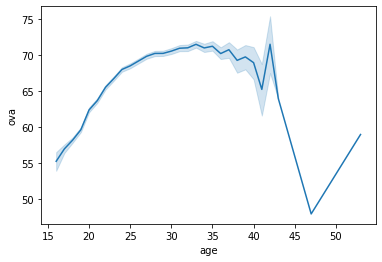

In [58]:
plt.figure()
sns.lineplot(data = df2, x= 'age', y = 'ova')

<function matplotlib.pyplot.show(close=None, block=None)>

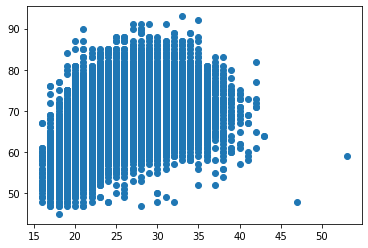

In [59]:
plt.scatter(df2['age'], df2['ova'])
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

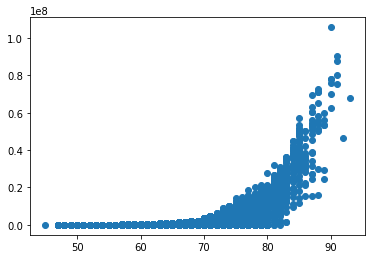

In [60]:
plt.scatter(df2['ova'], df2['market_value'])
plt.show

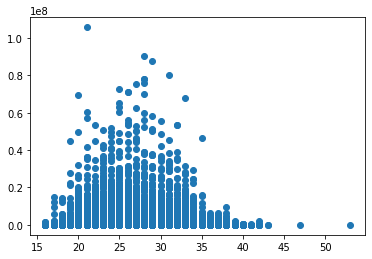

In [61]:
plt.scatter(df2['age'], df2['market_value'])
plt.show()

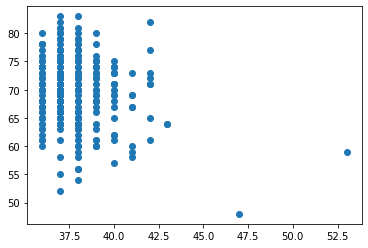

In [62]:
test = df2.sort_values(['age'], ascending = False)
test_sort1 = test.head(300)
plt.scatter(test_sort1['age'],test_sort1['ova'])
plt.show()

In [63]:
# Players with the highest market value

In [64]:
test =df2.sort_values(['market_value'], ascending = False)
test_sort = test.head(10)
test_sort

,name,age,ova,value,wage,position,club,market_value
9331,K. Mbappé,21,90,105500000.0,160000.0,ST LW RW,Paris Saint-Germain,105660000.0
2650,Neymar Jr,28,91,90000000.0,270000.0,LW CAM,Paris Saint-Germain,90270000.0
2871,K. De Bruyne,29,91,87000000.0,370000.0,CAM CM,Manchester City,87370000.0
2287,R. Lewandowski,31,91,80000000.0,240000.0,ST,FC Bayern München,80240000.0
5109,M. Salah,28,90,78000000.0,250000.0,RW,Liverpool,78250000.0
5030,S. Mané,28,90,78000000.0,250000.0,LW,Liverpool,78250000.0
4166,V. van Dijk,28,90,75500000.0,210000.0,CB,Liverpool,75710000.0
3665,J. Oblak,27,91,75000000.0,125000.0,GK,Atlético Madrid,75125000.0
4049,R. Sterling,25,88,72500000.0,270000.0,LW RW,Manchester City,72770000.0
3961,H. Kane,26,88,71000000.0,220000.0,ST,Tottenham Hotspur,71220000.0


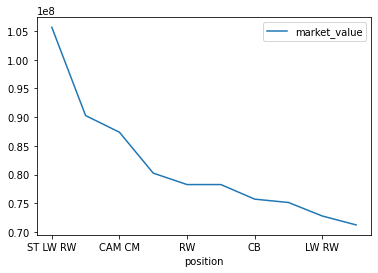

In [65]:
test_sort.plot(x= 'position', y= 'market_value')
plt.show()

In [67]:
test_data = df2[['age','ova','market_value']]
test_data.head()         

,age,ova,market_value
0,33,69,632000.0
1,37,71,607000.0
2,33,71,1115000.0
4,36,81,5512000.0
5,27,66,730000.0
